<a href="https://colab.research.google.com/github/ag12s/CreateWithCodeCODES/blob/main/PollutionExp_Example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Install the required package for reading in video data
!pip install pyvideoreader

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from videoreader import VideoReader
import plotly.express as px
import cv2
from google.colab import files
import pandas as pd
from progressbar import ProgressBar

Read in video file using pyVideoReader. Prints video_file_name, number of frames, frame rate and frame size.
Create temporary image file.

In [ ]:
# This command allows you to upload a file from your computer to the cloud where this notebook exists
files.upload()
#We use VideoReader to read in frames from our video. INSERT THE NAME OF THE VIDEO YOU ARE UPLOADING BEFORE UPLOADING FILE...otherwise, it will complain. 
video_file = VideoReader('NoObs_0p15mpers_short.mp4')

print(video_file)  # prints video_file_name, number of frames, frame rate and frame size

NoObs_0p15mpers_short.mp4 with 54 frames of size (720, 1280, 3) at 30.00 fps


Loop through frames of video and save frames to image files.

Load image file

In [ ]:
file_count = 0
start = 1
end = 10 #How many frames do you want to work with?

frame_count = 0
cap2 = cv2.VideoCapture("NoObs_0p15mpers_short.mp4")
# While the video file is open, we iterate through the video, extract the frames, and save them to a JPEG image file. 
while (cap2.isOpened()):
    if frame_count >= start and frame_count < (end+1):
        success,image = cap2.read()
        if success == False:
            break
        cv2.imwrite('Frame_'+str(frame_count)+'.jpg', image) # save frame as JPEG file      
        print('Read a new frame: ', success)
    frame_count += 1
    if frame_count == (end+1): #close video file once frames have been retrieved
        cap2.release() 

Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


Now we are going to vidualize one frame and decide what section we want to analyze

In [ ]:
img_rgb = plt.imread('Frame_1.jpg')
fig = px.imshow(img_rgb)
fig.show()

For this example, we are going to crop the image to the paper at the top. To do this, we need to trim our data in x.

In [ ]:
img_rgb = img_rgb[400:650,290:1032,:]
fig = px.imshow(img_rgb)
fig.show()

Select color ranges from the image above to splice frame into dark, medium, and light color matrices based off chosen color concentration ranges.

In [ ]:
#input concentration ranges
dark_red = 190 
dark_green = 75  
dark_blue = 40  

med_red = 198
med_green = 108
med_blue = 44

light_red = 213
light_green = 154
light_blue = 94


In [ ]:
img_rgb2 = plt.imread('Frame_2.jpg')
img_rgb3 = plt.imread('Frame_3.jpg')
img_rgb4 = plt.imread('Frame_4.jpg')
img_rgb5 = plt.imread('Frame_5.jpg')
img_rgb6 = plt.imread('Frame_6.jpg')
img_rgb7 = plt.imread('Frame_7.jpg')
img_rgb8 = plt.imread('Frame_8.jpg')
img_rgb9 = plt.imread('Frame_9.jpg')
img_rgb10 =plt.imread('Frame_10.jpg')


In [ ]:

img_rgb2 = img_rgb2[400:650,290:1032,:]
img_rgb3 = img_rgb3[400:650,290:1032,:]
img_rgb4 = img_rgb4[400:650,290:1032,:]
img_rgb5 = img_rgb5[400:650,290:1032,:]
img_rgb6 = img_rgb6[400:650,290:1032,:]
img_rgb7 = img_rgb7[400:650,290:1032,:]
img_rgb8 = img_rgb8[400:650,290:1032,:]
img_rgb9 = img_rgb9[400:650,290:1032,:]
img_rgb10 = img_rgb10[400:650,290:1032,:]


In [ ]:
# Put all the frames into a matrix
img_rgb = np.stack((img_rgb,img_rgb2,img_rgb3,img_rgb4,img_rgb5,img_rgb6,img_rgb7,img_rgb8,img_rgb9,img_rgb10), axis = -1)

Splice our 3D matrix so that we have a matrix for red, green, and blue values.

In [ ]:
#splicing jpeg image into red, green, blue channel matrices
Red = img_rgb[:,:,0,:]
Green = img_rgb[:,:,1,:]
Blue = img_rgb[:,:,2,:]

Separate colors by dark, medium, and light for Red

In [ ]:
#initialize color range matrices for Red
Red_light = np.zeros(Red.shape)
Red_med = np.zeros(Red.shape)
Red_dark = np.zeros(Red.shape)

# Separate colors by dark, medium, and light color ranges for RED
for k in range(np.size(Red,2)):
  for i in range(len(Red)):
    for j in range(np.size(Red, 1)):
      if Red[i,j,k] <= dark_red:
        Red_dark[i,j,k] = Red[i,j,k]
      elif Red[i,j,k] > dark_red and Red[i,j,k] < light_red:
        Red_med[i,j,k] = Red[i,j,k]
      elif Red[i,j,k] >= light_red:
        Red_light[i,j,k] = Red[i,j,k]


Now we are going to again separate colors by dark, medium, and light for Green where Red is satisfied.  

In [ ]:
#initialize color range matrices for Green
Green_light = np.zeros(Green.shape)
Green_med = np.zeros(Green.shape)
Green_dark = np.zeros(Green.shape)

# Separate colors by dark, medium, and light color ranges for Green, using the ranges for Red
for k in range(np.size(Green,2)):
  for i in range(len(Green)):
    for j in range(np.size(Green, 1)):
      if Green[i,j,k] <= dark_green:
        Green_dark[i,j,k] = Red_dark[i,j,k]
      elif Green[i,j,k] > dark_green and Green[i,j,k] < light_green:
        Green_med[i,j,k] = Red_med[i,j,k]
      elif Green[i,j,k] >= light_green:
        Green_light[i,j,k] = Red_light[i,j,k]


Lastly, we are going to separate colors by dark, medium, and light for Blue where Green and Red are satisfied.

In [ ]:
#Initialize color range matrices
Blue_light = np.zeros(Blue.shape)
Blue_med = np.zeros(Blue.shape)
Blue_dark = np.zeros(Blue.shape)

# Separate colors by dark, medium, and light color ranges for Green, using the ranges for Green
for k in range(np.size(Blue,2)):
  for i in range(len(Blue)):
    for j in range(np.size(Blue, 1)):
      if Blue[i,j,k] <= dark_blue:
        Blue_dark[i,j,k] = Green_dark[i,j,k]
      elif Blue[i,j,k] > dark_blue and Blue[i,j,k] < light_blue:
        Blue_med[i,j,k] = Green_med[i,j,k]
      elif Blue[i,j,k] >= light_blue:
        Blue_light[i,j,k] = Green_light[i,j,k]


Rewrite into single dark, medium, and light matrices. To do this, we save our final color (Blue dark/med/light) since it has whittled down the areas satisfying all 3 color ranges.


In [ ]:
# Rewrite into single dark, medium, and light matrices
# To do this, we save our final color (Blue dark/med/light) since it has whittled down the areas satisfying all 3 color ranges
dark = Blue_dark
med = Blue_med
light = Blue_light

In [ ]:
#Initialize arrays for storage
dark_mm = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
dark_min = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
dark_max = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
med_mm = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
med_min = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
med_max = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
light_mm = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
light_min = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))
light_max = np.zeros((np.size(img_rgb,1), np.size(img_rgb,3)))

In [ ]:
# Get number of rows and columns in each image
total_row = np.size(img_rgb,0)
total_col = np.size(img_rgb,1)

pbar = ProgressBar()

for i in range(np.size(img_rgb,1)):  
  for j in range(np.size(img_rgb,3)):
    
    # Identify area in image to be analyzed
    dark_nonzero_idx = list(zip(*np.where(dark[:,:,j] > 0)))
    med_nonzero_idx = list(zip(*np.where(med[:,:,j] > 0)))
    light_nonzero_idx = list(zip(*np.where(light[:,:,j] > 0)))

    # Number of pixels with concentration
    dark_mm[i,j] = len(dark_nonzero_idx)
    med_mm[i,j] = len(med_nonzero_idx)
    light_mm[i,j] = len(light_nonzero_idx)

    # Min/max
    if dark_mm[i,j] == 0:
      dark_min[i,j] = 0
      dark_max[i,j] = 0
    else:
      dark_min[i,j] = dark_nonzero_idx[0][0]*total_col + dark_nonzero_idx[0][1]
      dark_max[i,j] = dark_nonzero_idx[-1][0]*total_col + dark_nonzero_idx[-1][1]

    if med_mm[i,j] == 0:
      med_min[i,j] = 0
      med_max[i,j] = 0
    else:
      med_min[i,j] = med_nonzero_idx[0][0]*total_col + med_nonzero_idx[0][1]
      med_max[i,j] = med_nonzero_idx[-1][0]*total_col + med_nonzero_idx[-1][1]

    if light_mm[i,j] == 0:
      light_min[i,j] = 0
      light_max[i,j] = 0
    else:
      light_min[i,j] = light_nonzero_idx[0][0]*total_col + light_nonzero_idx[0][1]
      light_max[i,j] = light_nonzero_idx[-1][0]*total_col + light_nonzero_idx[-1][1]


Now we find the average concentrations for the light, medium and dark color ranges

In [ ]:
light_mean = np.mean(light_mm, axis = 0)
med_mean = np.mean(med_mm, axis = 0)
dark_mean = np.mean(dark_mm, axis = 0)

In [ ]:
# Normalize each mean
light_mean_norm = light_mean/np.max(light_mm)
med_mean_norm = med_mean/np.max(med_mm)
dark_mean_norm = dark_mean/np.max(dark_mm)

Visualizing our data!!

In [ ]:
# Form a dataframe with all data we want to plot

# Colors
time = np.linspace(0, 9, num=len(light_mean_norm), axis=0)
# Data
data_to_plot = {'Light': light_mean_norm, 'Medium': med_mean_norm, 'Dark': dark_mean_norm, 'Frame': time}
df = pd.DataFrame(data=data_to_plot)

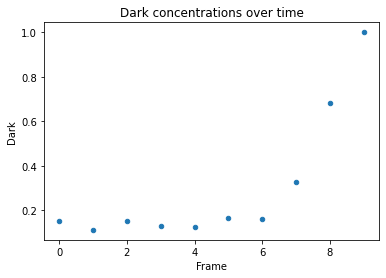

In [ ]:
# Visualize the dark data
df.plot(kind='scatter',x='Frame',y='Dark',title = 'Dark concentrations over time')

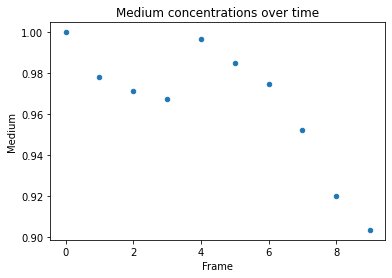

In [ ]:
df.plot(kind='scatter',x='Frame',y='Medium', title = 'Medium concentrations over time')

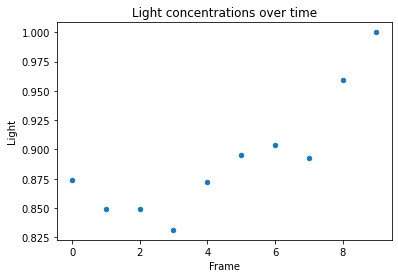

In [ ]:
df.plot(kind='scatter',x='Frame',y='Light', title = 'Light concentrations over time')